# SEG Bootcamp - first-look data analysis for continuous recordings

This notebook contains basic data visualization and analysis of the data collected with Stryde nodes at KAUST during the SEG Student Chapter bootcamp on Nov 7 2023.

The dataset is acquired as follows:

- <font color='blue'>Receivers</font>

    1 line of 89 buried receivers, equally spaced by 2m for a total lenght of 178m.

    1 receiver placed near (and following) the source

- <font color='red'>Sources</font>

    9 sources on the right side of the receiver line at Point 2001, 2010, 2019, 2028, 2037, 2046, 2055, 2064, 2073, 2082 (18m distance)

    10 shots per source

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pylops
import matplotlib.pyplot as plt

from matplotlib.colors import SymLogNorm
from pylops.signalprocessing import FFT2D

from pystryde.reader import *
from pystryde.preproc import *
from pystryde.cmap import cmaps
from pystryde.visual import *

## Single-receiver Continous record

2023-11-07 05:00:00 2023-11-07 08:59:00


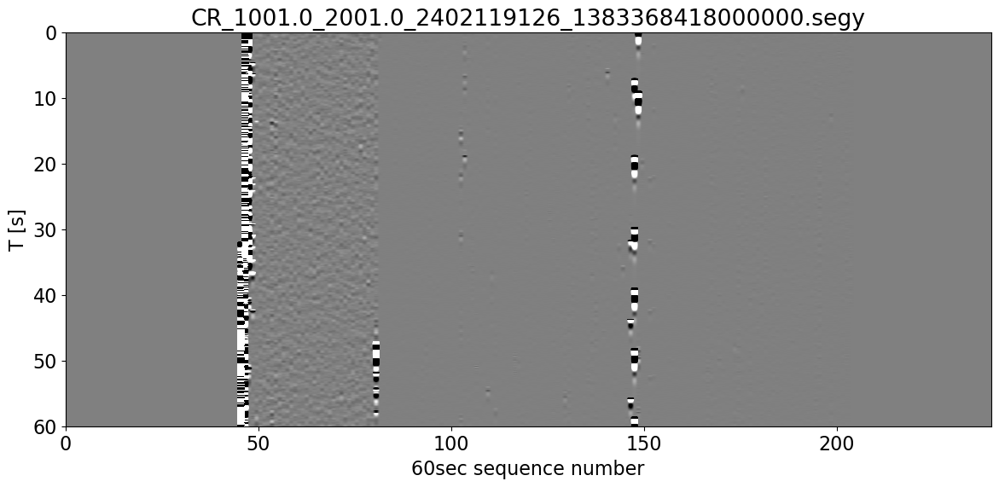

In [2]:
# Early deployment
f = strydecont('/mnt/datawaha_dig/Data/STRYDE/SEGBootcamp_07_11_2023/ContinuousRecords/CR_1001.0_2001.0_2402119126_1383368418000000.segy')
f.interpret()
f.getrecord()
print(f.utctime[0], f.utctime[-1])
f.plotrecord(figsize=(14, 6), title='CR_1001.0_2001.0_2402119126_1383368418000000.segy', clip=1e-3);

## Entire data Continous record

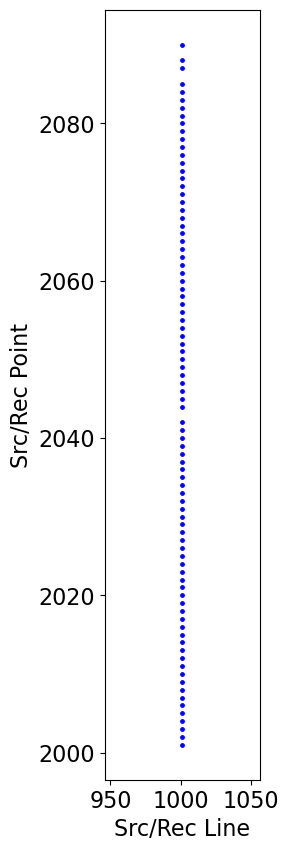

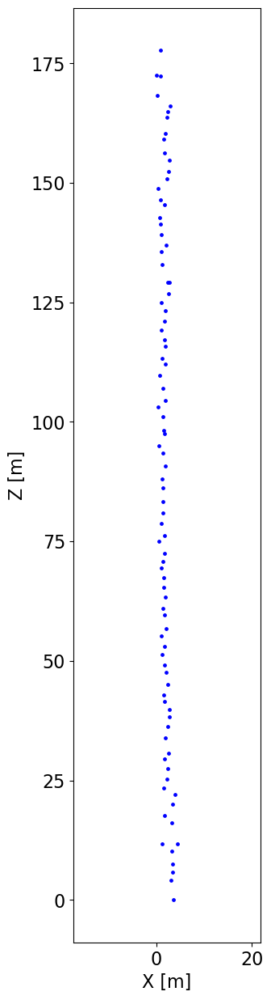

In [3]:
f = strydeconts('/mnt/datawaha_dig/Data/STRYDE/SEGBootcamp_07_11_2023/ContinuousRecords/')
f.interpret()
f.plotgeom(coords=False, figsize=(2, 10))
fig, ax = f.plotgeom(local=True, figsize=(3, 15))
ax.axis('equal')

# extract records in a choosen time window
f.getrecords(utctime_start=datetime.datetime(2023, 11, 7, 7, 0), utctime_end=datetime.datetime(2023, 11, 7, 8, 59))

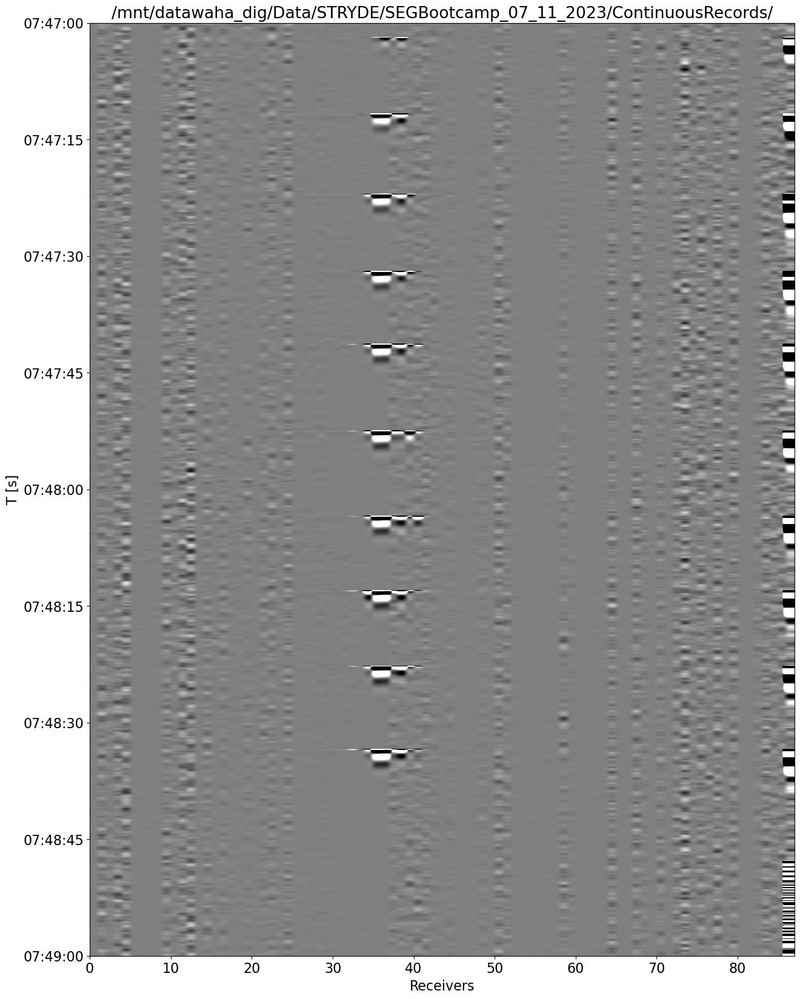

In [4]:
# display continous recording for a given time window multiple of 60sec
f.plotrecord(utctime_start=datetime.datetime(2023, 11, 7, 7, 47),
             utctime_end=datetime.datetime(2023, 11, 7, 7, 49), 
             clip=0.001, cmap='gray', figsize=(15, 20));

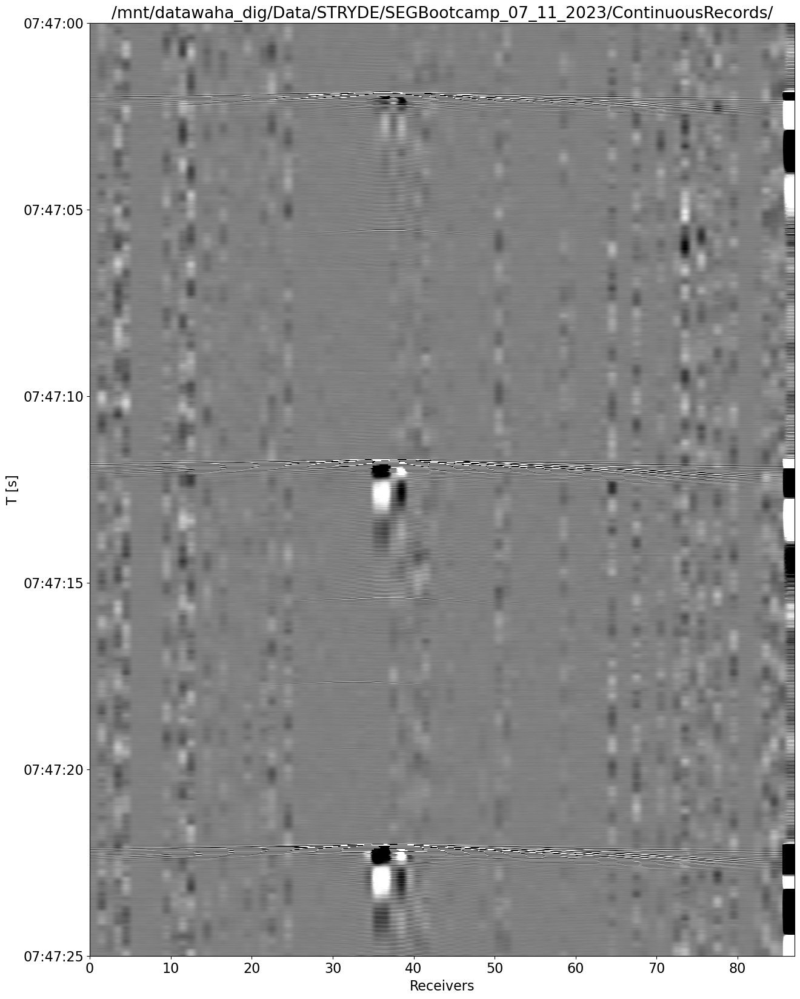

In [5]:
# display continous recording for a given time window (choosing to reduce the end time in terms of samples displayed)
f.plotrecord(utctime_start=datetime.datetime(2023, 11, 7, 7, 47),
             utctime_end=datetime.datetime(2023, 11, 7, 7, 49), 
             nsamples = int(25/f.dt), clip=0.001, cmap='gray', figsize=(15, 20));

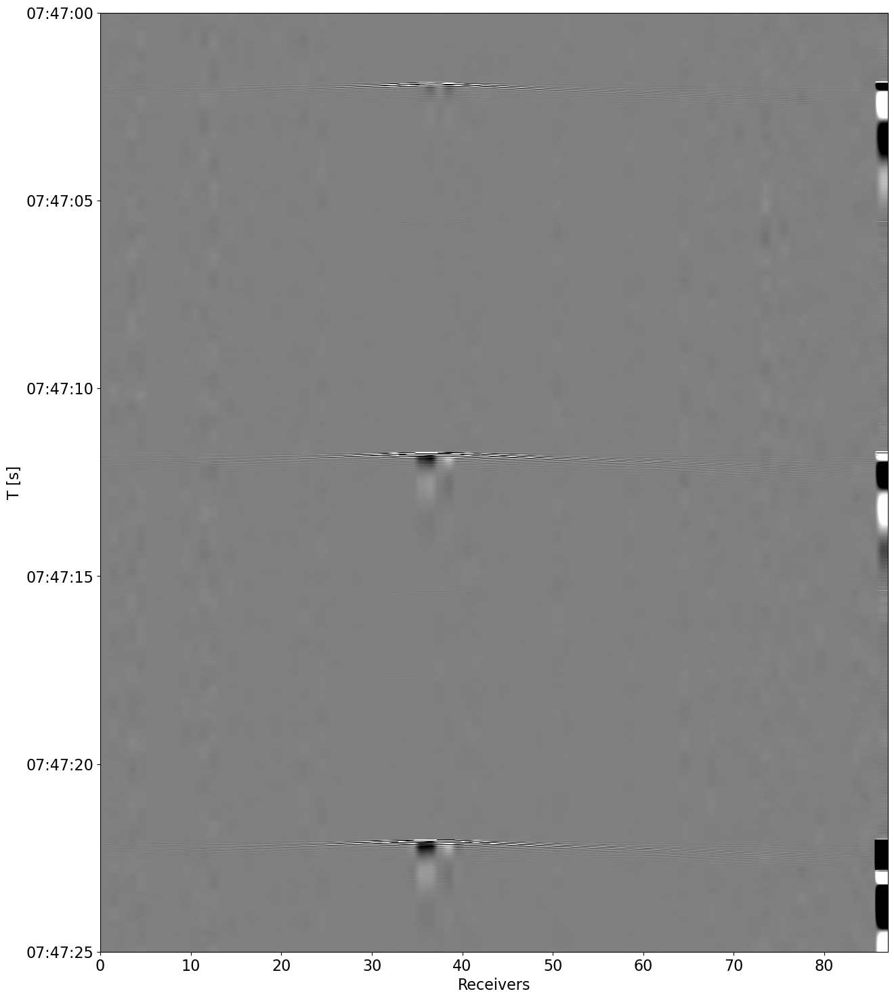

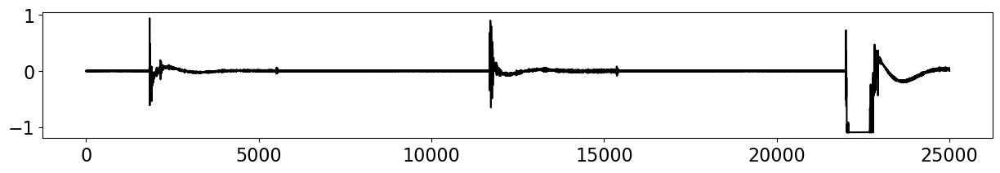

In [6]:
# extact portion of data and display it
data, tlims = f.extract(utctime_start=datetime.datetime(2023, 11, 7, 7, 47),
                        utctime_end=datetime.datetime(2023, 11, 7, 7, 48), 
                        nsamples = int(25/f.dt))

fig, ax = plt.subplots(1, 1, figsize=(15, 18))
ax.imshow(data, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tlims[-1], tlims[0]))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
#ax.set_ylim([ tlims[-1], datetime.datetime(2023, 11, 7, 7, 47, 11, 650000)])

plt.figure(figsize=(15, 2))
plt.plot(data[:, -1], 'k')

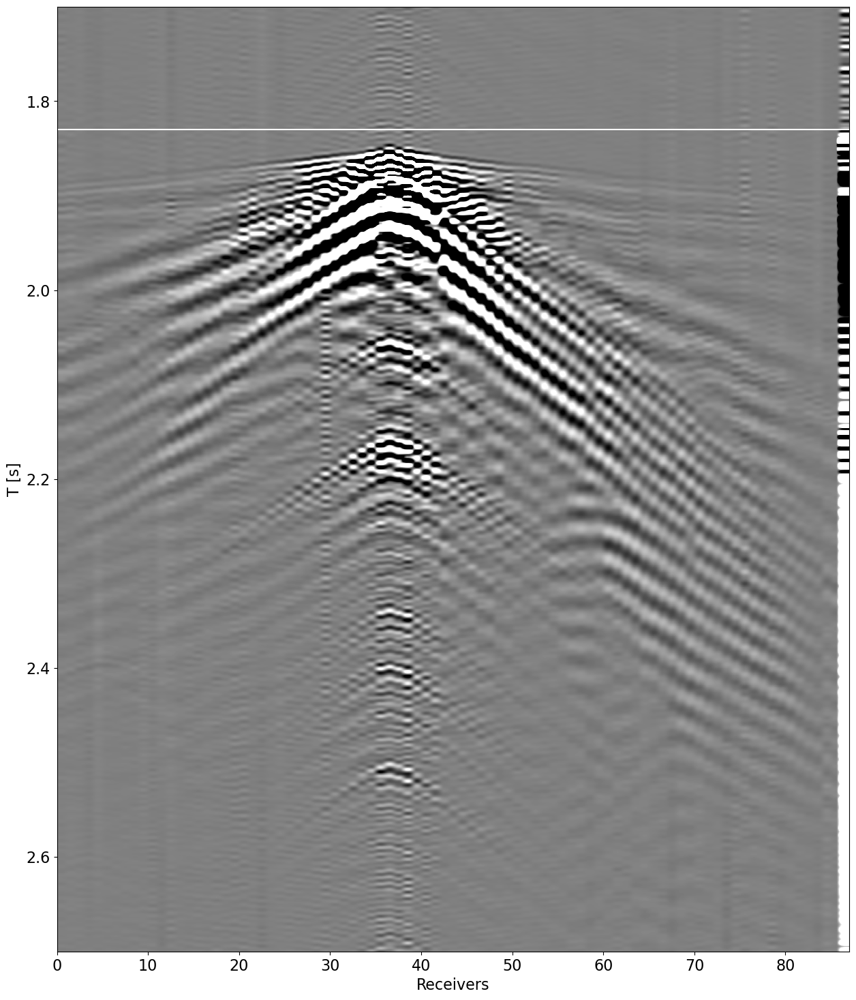

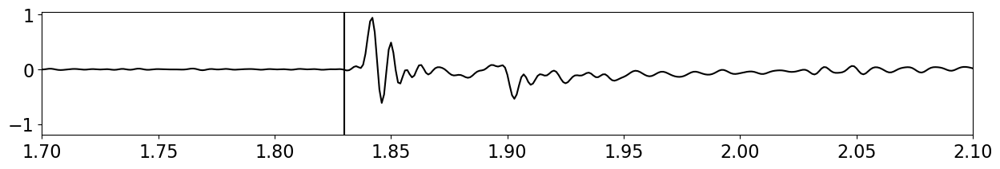

In [7]:
# extact small portion of data near an active shot and display it
data, tlims = f.extract(utctime_start=datetime.datetime(2023, 11, 7, 7, 47),
                        utctime_end=datetime.datetime(2023, 11, 7, 7, 48), 
                        nsamples = int(23/f.dt))

fig, ax = plt.subplots(1, 1, figsize=(15, 18))
ax.imshow(data, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, f.dt * data.shape[0], 0))
ax.axhline(1.83, color='w')
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_ylim([2.7, 1.7])

plt.figure(figsize=(15, 2))
plt.plot(np.arange(data.shape[0]) * f.dt, data[:, -1], 'k')
plt.xlim([1.7, 2.1])
plt.axvline(1.83, color='k')


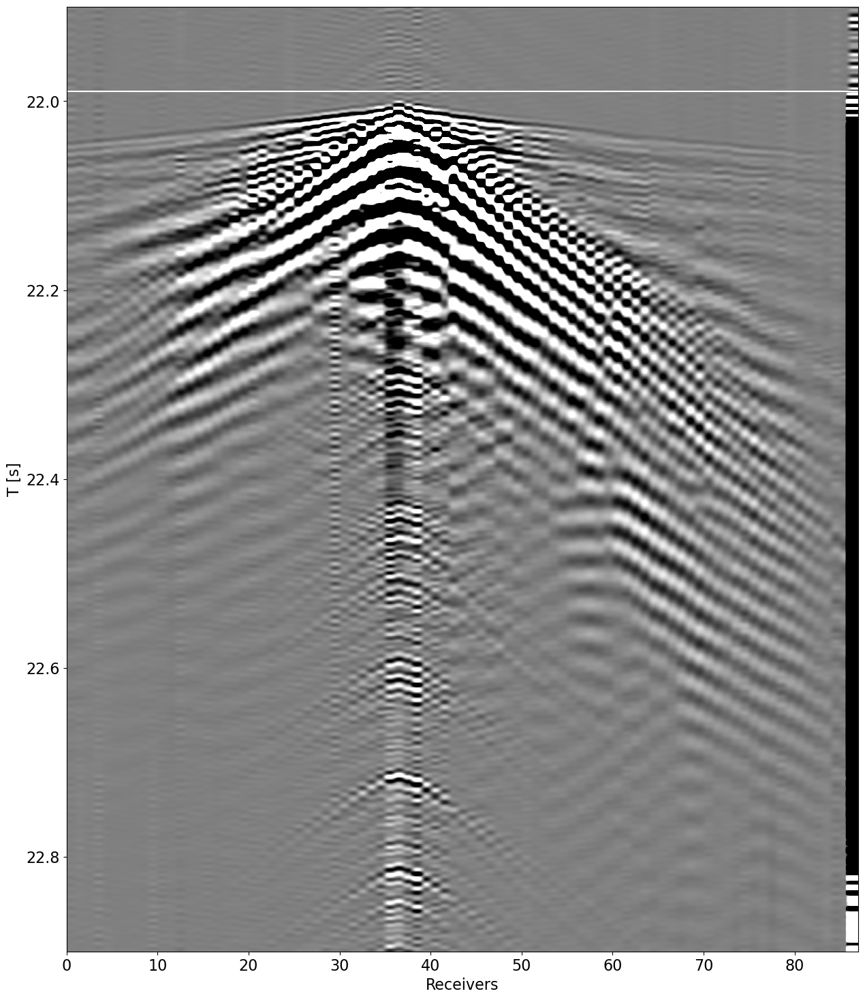

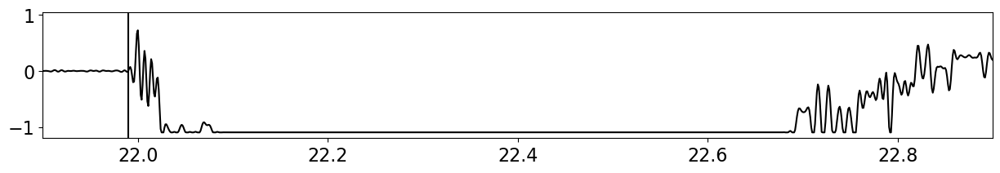

In [8]:
# extact small portion of data near an active shot and display it
data, tlims = f.extract(utctime_start=datetime.datetime(2023, 11, 7, 7, 47),
                        utctime_end=datetime.datetime(2023, 11, 7, 7, 48), 
                        nsamples = int(23/f.dt))

fig, ax = plt.subplots(1, 1, figsize=(15, 18))
ax.imshow(data, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, f.dt * data.shape[0], 0))
ax.axhline(21.99, color='w')
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_ylim([22.9, 21.9])

plt.figure(figsize=(15, 2))
plt.plot(np.arange(data.shape[0]) * f.dt, data[:, -1], 'k')
plt.xlim([21.9, 22.9])
plt.axvline(21.99, color='k')


## Shot 3

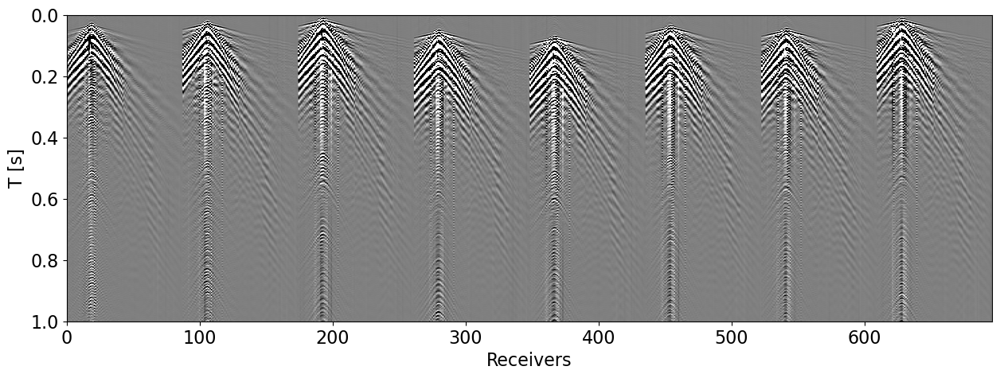

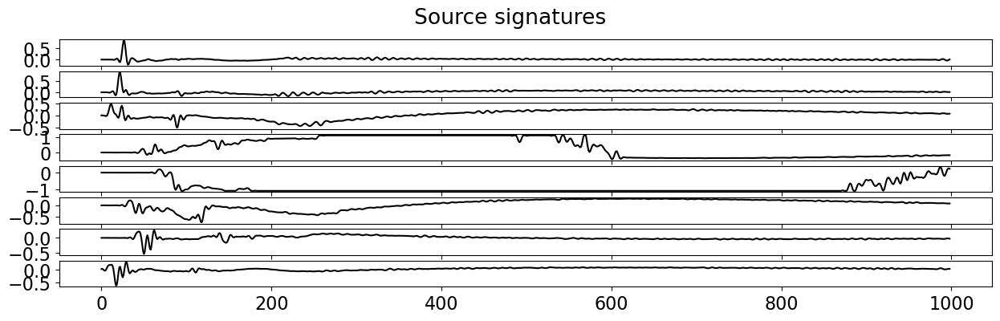

In [9]:
# extract multiple shots and stack them
t0s = [datetime.datetime(2023, 11, 7, 7, 36, 16, 000000),
       datetime.datetime(2023, 11, 7, 7, 36, 28, 750000),
       datetime.datetime(2023, 11, 7, 7, 36, 39, 780000),
       datetime.datetime(2023, 11, 7, 7, 36, 49, 400000),
       datetime.datetime(2023, 11, 7, 7, 36, 59, 350000),
       datetime.datetime(2023, 11, 7, 7, 37, 8, 600000),
       datetime.datetime(2023, 11, 7, 7, 37, 18, 900000),
       datetime.datetime(2023, 11, 7, 7, 37, 29, 10000),
       ]
tmax = 1

datacont, tlims = f.extract(utctime_start=datetime.datetime(2023, 11, 7, 7, 36),
                            utctime_end=datetime.datetime(2023, 11, 7, 7, 38))
sourcesig = []
datas = []
for t0 in t0s:
       dataextract = datacont[int((t0-tlims[0]).total_seconds() // f.dt):, :-1]
       datas.append(dataextract[:int(tmax // f.dt)].T[np.newaxis])
       sourceextract = datacont[int((t0-tlims[0]).total_seconds() // f.dt):, -1]
       sourcesig.append(sourceextract[:int(tmax // f.dt)])

datas = np.concatenate(datas)
sourcesig = np.vstack(sourcesig)

fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.imshow(datas.reshape(datas.shape[0]*datas.shape[1], -1).T, 
          cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs*len(t0s), tmax, 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]');

fig, axs = plt.subplots(len(t0s), figsize=(15, 4))
fig.suptitle('Source signatures')
for iax, ax in enumerate(axs):
    ax.plot(sourcesig[iax], 'k')


Indices of max aligment: [89 99 61 40 75 65 98]
Indices of max aligment after shifts: [89 89 89 89 89 89 89]


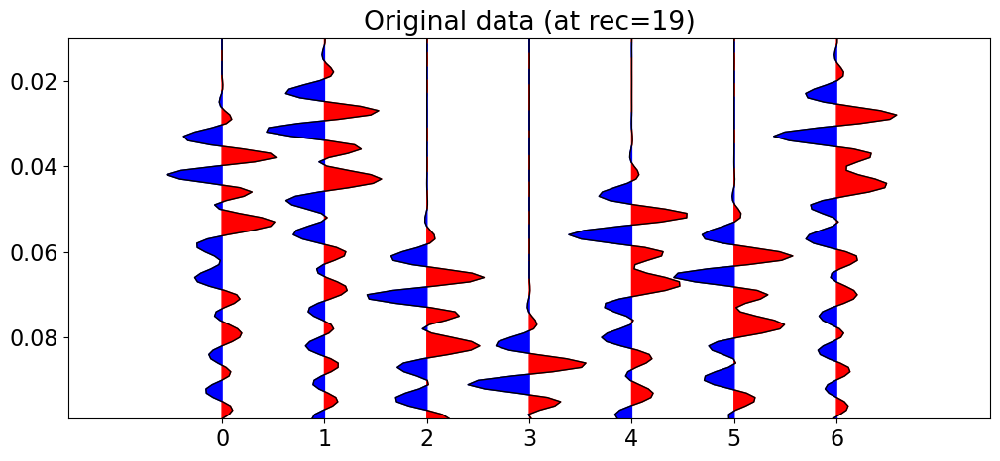

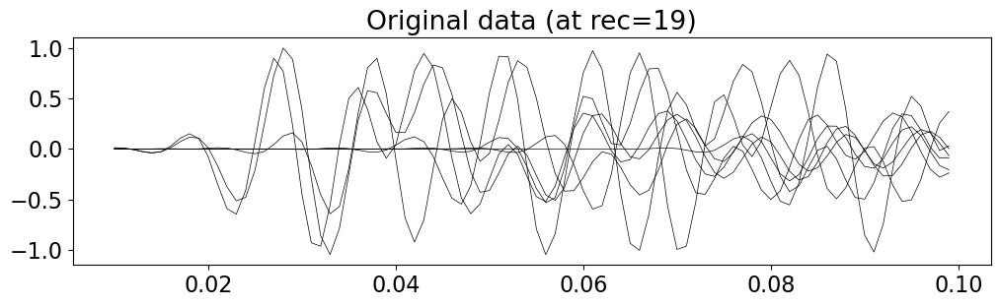

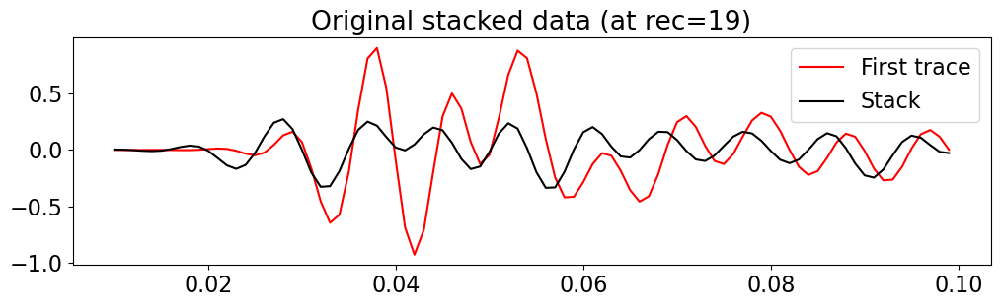

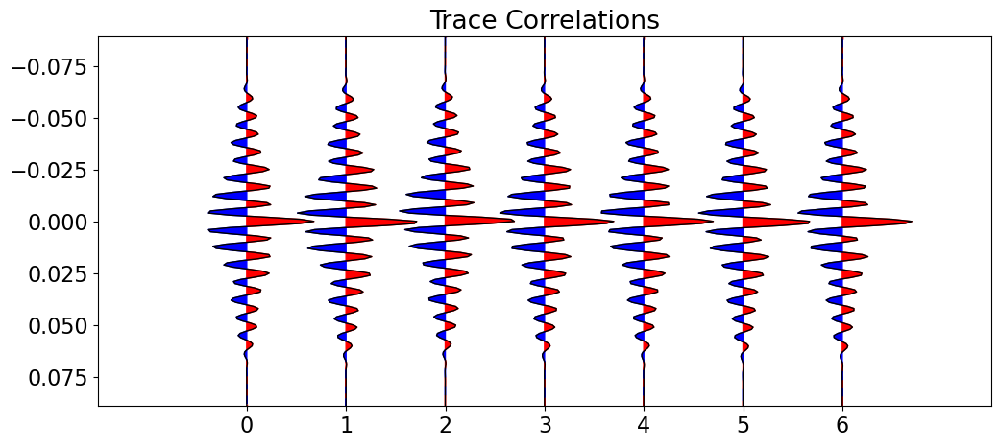

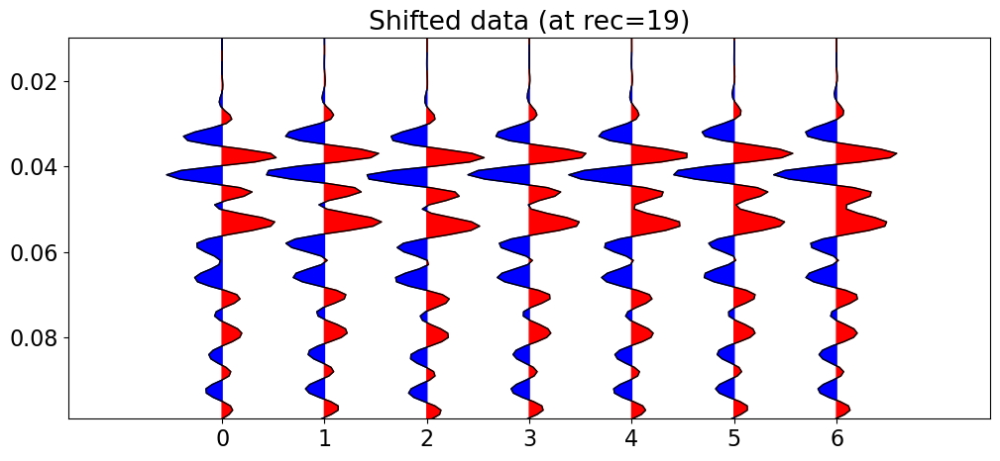

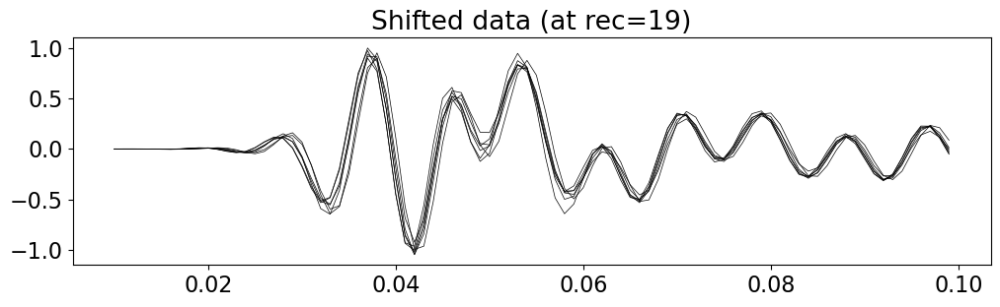

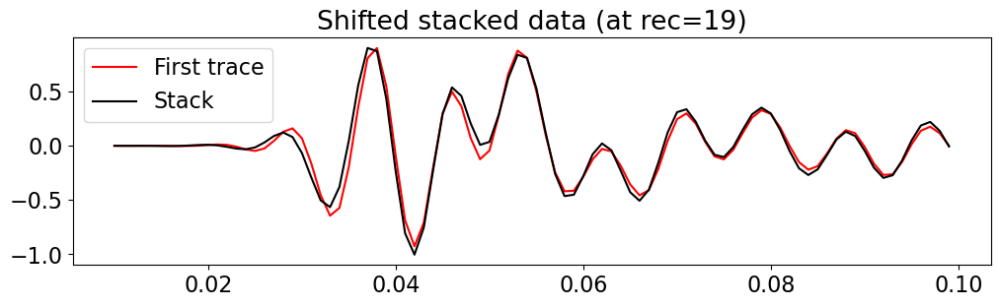

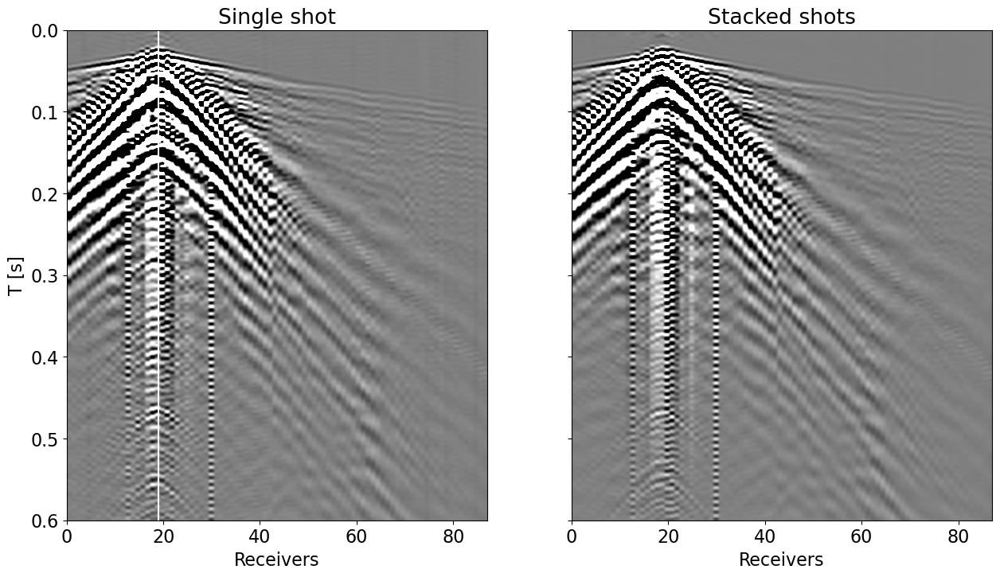

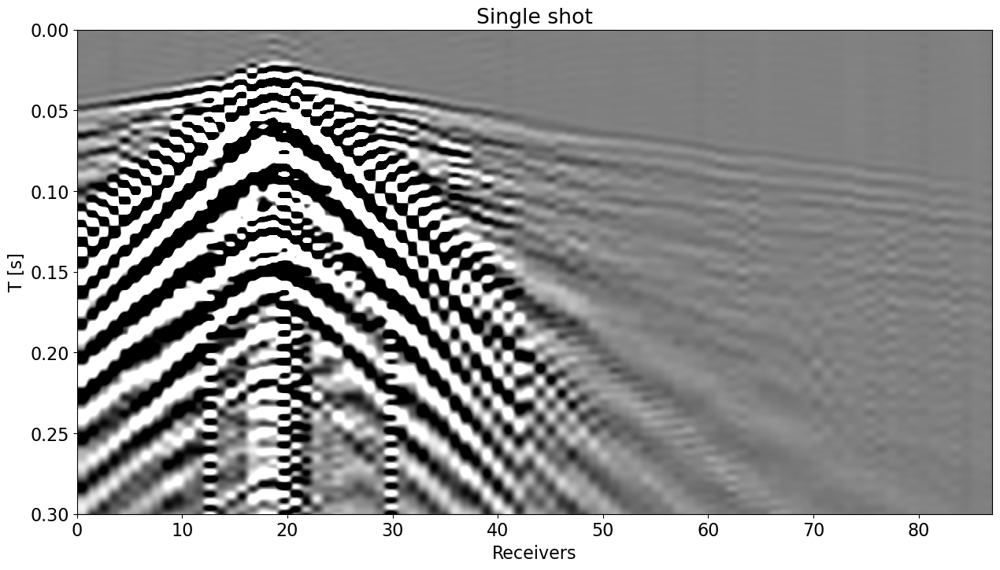

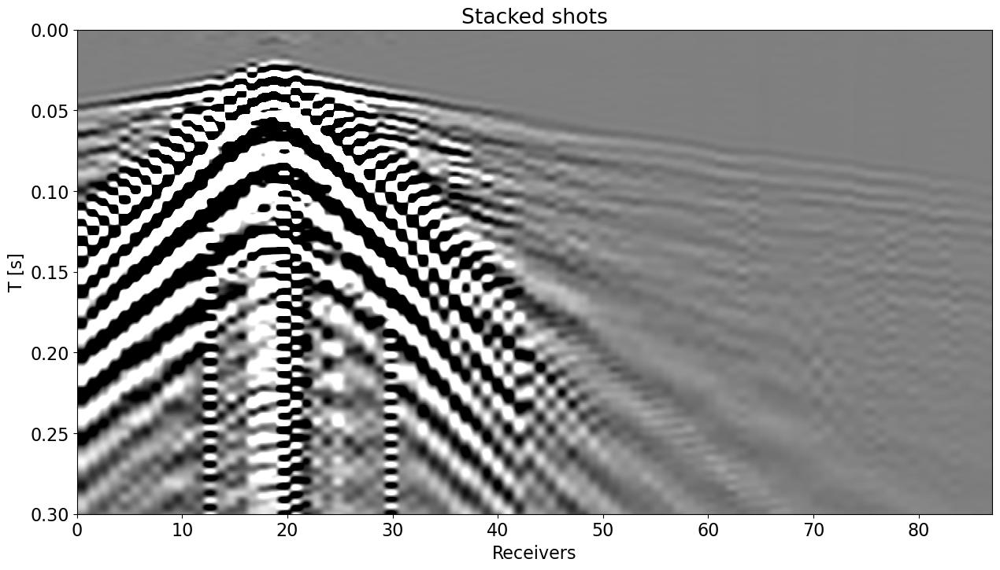

In [10]:
# align data
irec = 19
datashift, figs = aligndata(datas[1:], irec, f.t, tlims=(10, 100), plotflag=True)
dataaligned = np.mean(datashift, axis=0)

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(15, 8))
axs[0].imshow(datashift[2].T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
axs[0].axvline(irec, color='w')
axs[0].axis('tight')
axs[0].set_xlabel('Receivers')
axs[0].set_ylabel('T [s]')
axs[0].set_title('Single shot')
axs[1].imshow(dataaligned.T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
axs[1].axis('tight')
axs[1].set_xlabel('Receivers')
axs[1].set_title('Stacked shots')
axs[1].set_ylim(0.6, 0)

fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(datashift[2].T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_title('Single shot')
ax.set_ylim(0.3, 0);

fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(dataaligned.T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_title('Stacked shots')
ax.set_ylim(0.3, 0);

## Shot 5

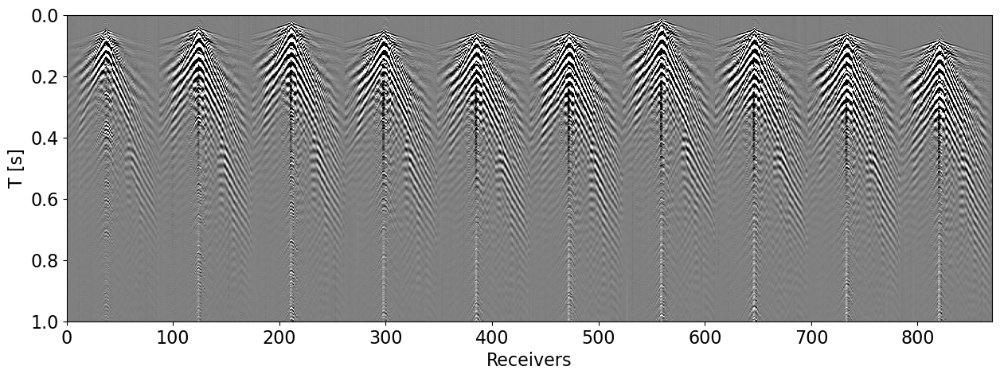

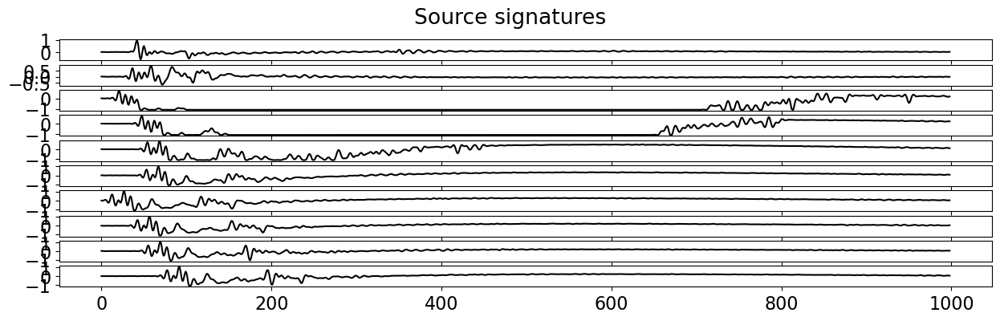

In [12]:
# extract multiple shots and stack them
t0s = [datetime.datetime(2023, 11, 7, 7, 47, 1, 800000),
       datetime.datetime(2023, 11, 7, 7, 47, 11, 650000),
       datetime.datetime(2023, 11, 7, 7, 47, 21, 980000),
       datetime.datetime(2023, 11, 7, 7, 47, 31, 900000),
       datetime.datetime(2023, 11, 7, 7, 47, 41, 250000),
       datetime.datetime(2023, 11, 7, 7, 47, 52, 400000),
       datetime.datetime(2023, 11, 7, 7, 48, 3, 400000),
       datetime.datetime(2023, 11, 7, 7, 48, 12, 950000),
       datetime.datetime(2023, 11, 7, 7, 48, 22, 660000),
       datetime.datetime(2023, 11, 7, 7, 48, 33, 330000)
       ]
tmax = 1

datacont, tlims = f.extract(utctime_start=datetime.datetime(2023, 11, 7, 7, 47),
                            utctime_end=datetime.datetime(2023, 11, 7, 7, 49))
sourcesig = []
datas = []
for t0 in t0s:
       dataextract = datacont[int((t0-tlims[0]).total_seconds() // f.dt):, :-1]
       datas.append(dataextract[:int(tmax // f.dt)].T[np.newaxis])
       sourceextract = datacont[int((t0-tlims[0]).total_seconds() // f.dt):, -1]
       sourcesig.append(sourceextract[:int(tmax // f.dt)])

datas = np.concatenate(datas)
sourcesig = np.vstack(sourcesig)

fig, ax = plt.subplots(1, 1, figsize=(15, 5))
ax.imshow(datas.reshape(datas.shape[0]*datas.shape[1], -1).T, 
          cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs*len(t0s), tmax, 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]');

fig, axs = plt.subplots(len(t0s), figsize=(15, 4))
fig.suptitle('Source signatures')
for iax, ax in enumerate(axs):
    ax.plot(sourcesig[iax], 'k')


Indices of max aligment: [ 89 105  78  72  73 113  83  71  48]
Indices of max aligment after shifts: [89 89 89 89 89 89 89 89 89]


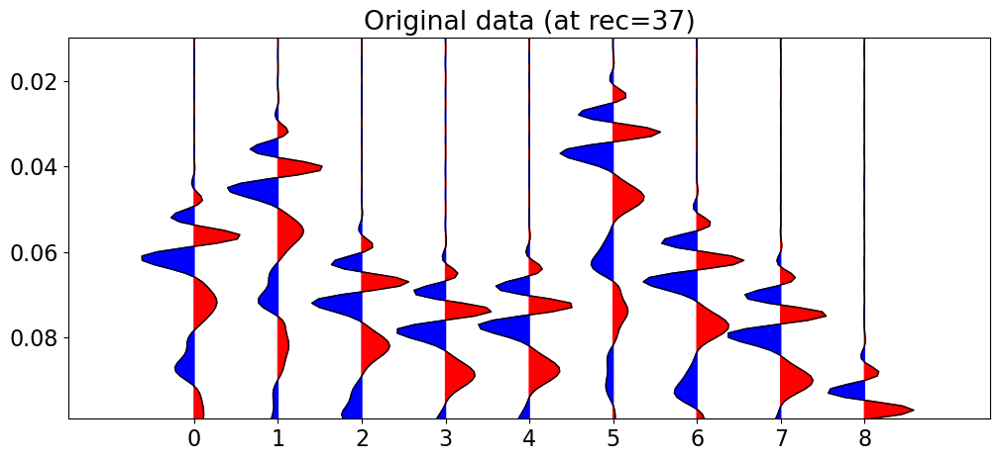

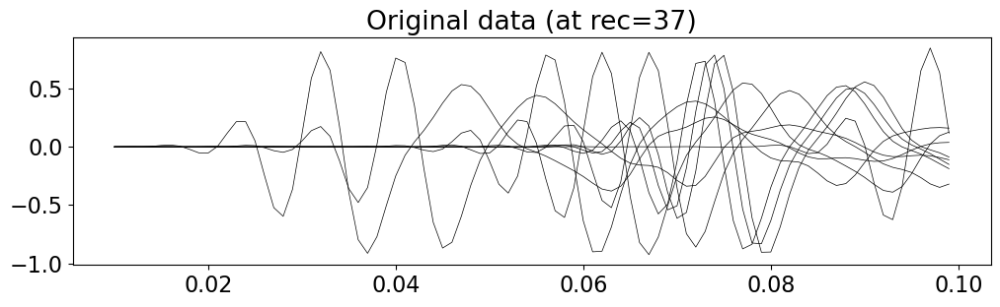

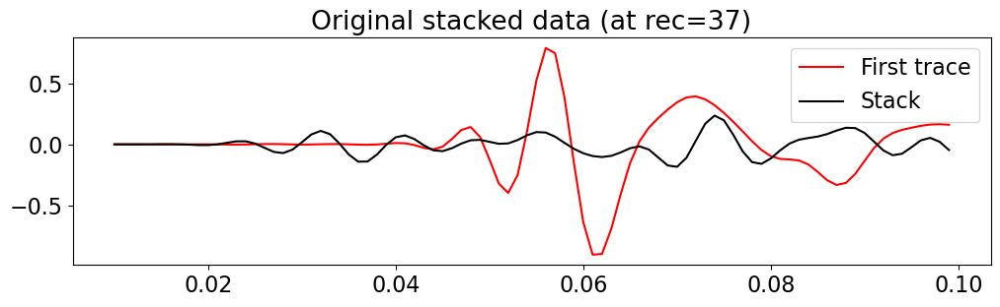

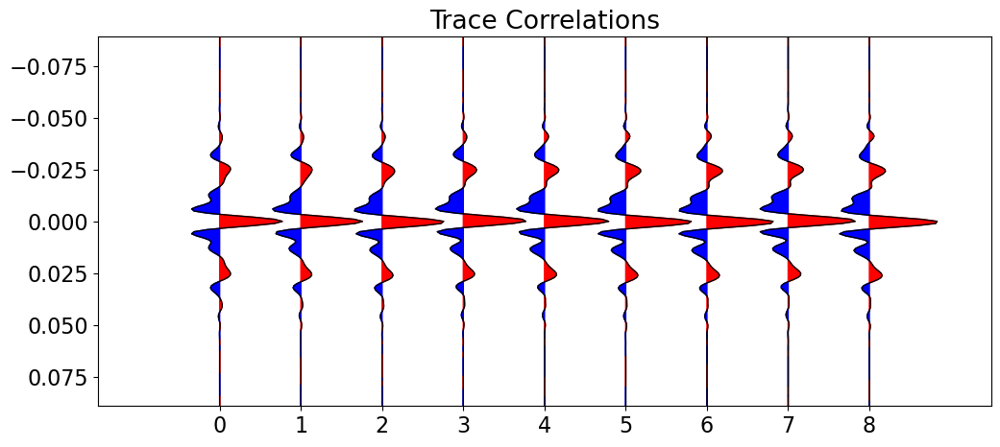

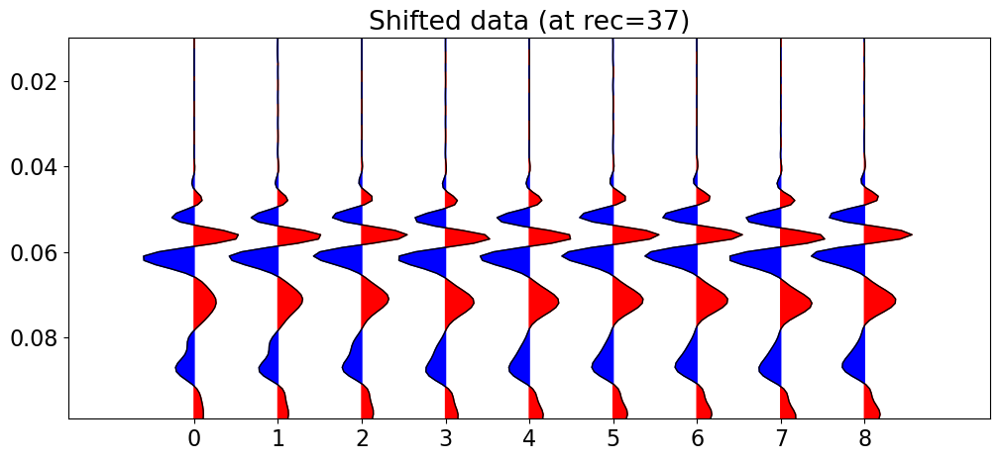

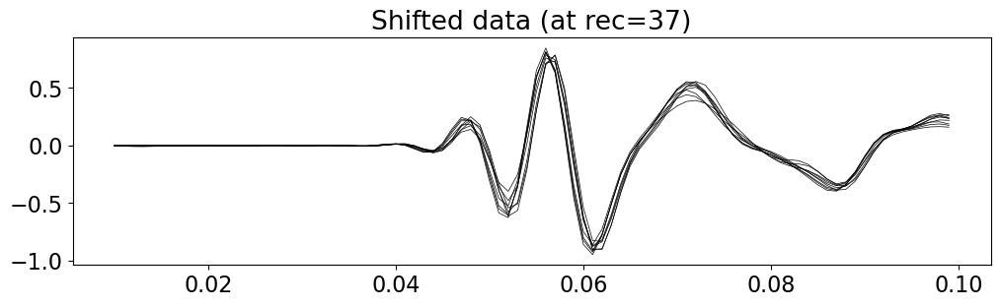

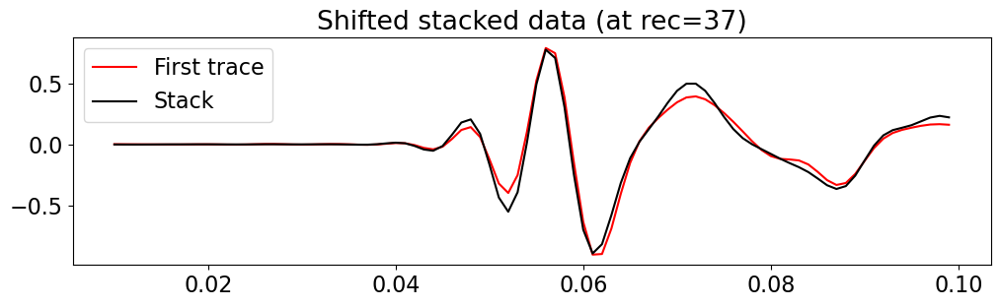

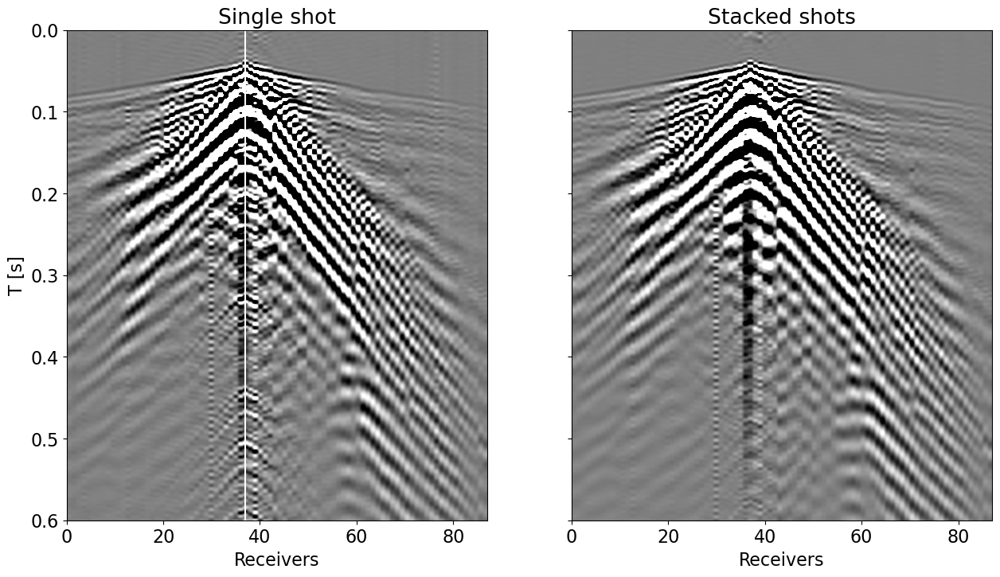

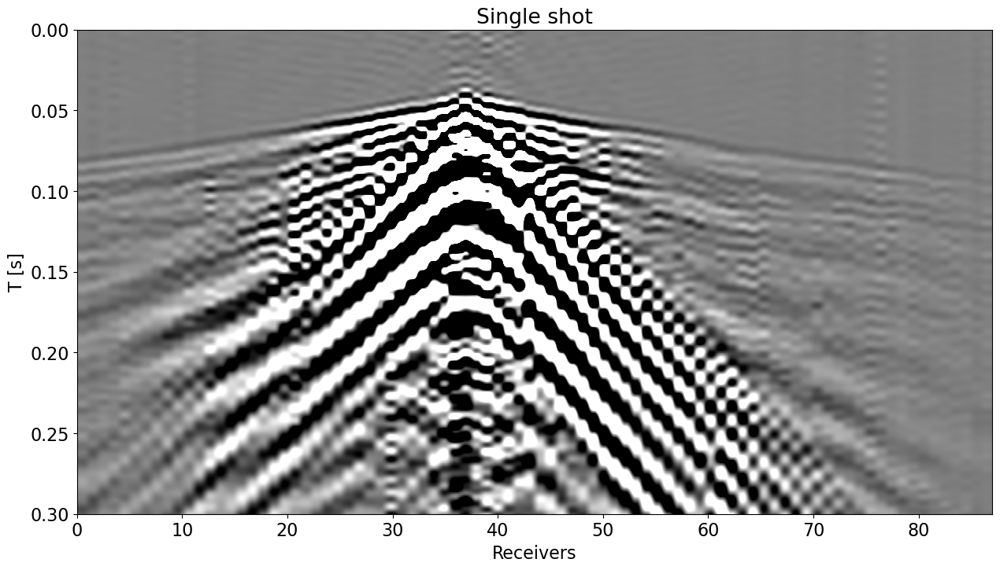

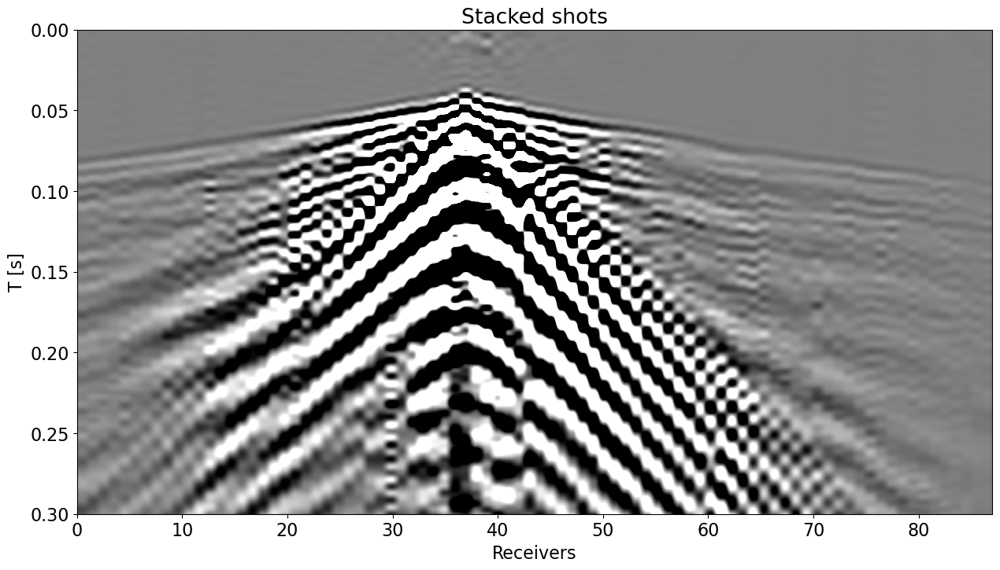

In [13]:
# align data
irec = 37
datashift, figs = aligndata(datas[1:], irec, f.t, tlims=(10, 100), plotflag=True)
dataaligned = np.mean(datashift, axis=0)

fig, axs = plt.subplots(1, 2, sharey=True, figsize=(15, 8))
axs[0].imshow(datashift[2].T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
axs[0].axvline(irec, color='w')
axs[0].axis('tight')
axs[0].set_xlabel('Receivers')
axs[0].set_ylabel('T [s]')
axs[0].set_title('Single shot')
axs[1].imshow(dataaligned.T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
axs[1].axis('tight')
axs[1].set_xlabel('Receivers')
axs[1].set_title('Stacked shots')
axs[1].set_ylim(0.6, 0)

fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(datashift[2].T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_title('Single shot')
ax.set_ylim(0.3, 0);

fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(dataaligned.T, cmap='gray', vmin=-0.01, vmax=0.01, extent=(0, f.nrecs, tmax, 0))
ax.axis('tight')
ax.set_xlabel('Receivers')
ax.set_ylabel('T [s]')
ax.set_title('Stacked shots')
ax.set_ylim(0.3, 0);